In [1]:
%matplotlib inline  
# esta linea se usa para poder visualizar gráficos

In [2]:
#PASO 1
from skimage import io #Librerias para importar las imagenes

#PASO 2
from skimage import img_as_ubyte#Mostrar las 3 imagenes
from skimage.color import rgb2grey#Mostrar las 3 imagenes
from skimage.color import rgb2hsv#Mostrar las 3 imagenes
import numpy as np#Mostrar las 3 imagenes
import matplotlib.pyplot as plt#Mostrar las 3 imagenes

#PASO 3
from skimage.filters import threshold_otsu

#PASO 4

#PASO 5
from skimage.morphology import erosion, dilation, opening, closing, white_tophat
from skimage.morphology import black_tophat, skeletonize, convex_hull_image, remove_small_objects
from skimage.morphology import disk, reconstruction
from skimage.morphology import binary_erosion,rectangle,binary_dilation

#PASO 6
from skimage.transform import hough_line, hough_line_peaks,probabilistic_hough_line
from skimage.feature import canny
from skimage import data
##imports para el uso de interactive
from ipywidgets import interact, interactive, fixed
import ipywidgets as widgets
from IPython.display import display
import numpy as np
import matplotlib.pyplot as plt

#PASO 7

#PASO 8
import math

#PASO 9
import networkx as nx
from networkx.algorithms import approximation as apxa

class Procesado():

    def __init__(self):
        pass
    #PASO 1
    ##Funcion Para leer una imagen a traves de scikit-Image (skimage)
    #dandole el path de la imagen
    #Return: Img imagen leida
    def leerImagen(self,pathImg):
        #pathImg="/Users/Ismael/Desktop/TFG_DietaPorDientes/TrabajosPasadosPorJose/dietaJose/ATP02 UE4 46.jpg"
        img = io.imread(pathImg)
        return img

    #PASO 2
    #Entrada: img imagen original leida anteriormente
    #Pasamos la imagen al espacio de color RGB y nos quedamos con el canal rojo
    #Pasamos la imagen al espacio de color HSV
    #Normalizamos la imagen del espacio de color HSV para utilizar que distancia 
    #  al rojo tenemos y poder hacer el theshold
    #Return: distance_red distancia de cada pixel al rojo apra luego hacer el threshold
    def distanciaAlRojo(self,img):
        rojo=img[:,:,0]
        imgHSV=rgb2hsv(img)
        distance_red = rgb2grey(1 - np.abs(imgHSV - (0, 1, 0)))
        return distance_red

    #PASO 3
    #Entrada: distance_red distancia de cada pixel al rojo apra luego hacer el threshold
    #Binarizamos la imagen para obtener una clara diferenciacion entre 
    #el fondo y las lineas que queremos detectar
    #Return: imgBin imagen binarizada
    def binarizar(self,distance_red):
        threshold_global_otsu = threshold_otsu(distance_red)
        imgBin = distance_red >= threshold_global_otsu
        return imgBin

    #PASO 4
    #Entrada:  imgBin imagen binarizada
    #Como la imagen no hay qeu procesarla completa porque solo tiene una region
    #marcada con lineas tenemos qque recortarla
    #Return: 
    #    imgBinCrop: Es la imagen binarizada recortada a la region que queremos
    #    imgCrop: Es la imagen original recortada a la region que queremos
    def cropImg(self,imgBin,img):
        imgBinCrop = imgBin[0:750,500:1500]
        imgCrop = img[0:750,500:1500]

        #imgBinCrop = imgBin
        #imgCrop = img

        #imgBinCrop = imgBin[0:750,0:750]
        #imgCrop = img[0:750,0:750]
        return imgBinCrop,imgCrop

    #PASO 5
    #Entrada: imgBinCrop Es la imagen binarizada recortada a la region que queremos
    #Esta funcion en lo que consiste es qeu entrando la imagen binarizada 
    #reduzcamos el tamaño de las lineas para que la deteccion tenga menos
    #incertidumbre y sea mas rápida la deteccion de lineas
    #Return: sinRuido Es la imagen una vez corregida la binarizacion apra que las 
    #        lineas sean mas delgadas.
    def reducirGrosor(self,imgBinCrop):
        selem2 = rectangle(8,1)
        selem = rectangle(3,1)
        #sinRuido = binary_dilation(imgBinCrop,selem2)
        #sinRuido = binary_erosion(imgBinCrop,selem)
        sinRuido = skeletonize(imgBinCrop)
        return sinRuido

    #PASO 6
    #Entrada:
    #    threshold: Densidad de lineas 
    #    line_length: Distancia minima de las lineas que calcula.
    #    line_gap: Distancia a la que si estan los extremos de las rectas las una
    #    sinRuido:Es la imagen una vez corregida la binarizacion apra que las 
    #        lineas sean mas delgadas.
    #Esta funcion lo que va a hacer es calcular los segmentos(ORIGEN"Ox,Oy" Y FIN "FX,FY") 
    #de cada una de las lineas que se han detectado en la imagen binarizada atraves de la 
    #funcion probabilistica de la transformada de hough
    #Return: lines Lista de todos los segmentos que ha detectado.
    def proHough(self,threshold,line_length,line_gap,sinRuido):
        lines = probabilistic_hough_line(sinRuido, threshold, line_length, line_gap)
        return lines 

    #PASO 7
    #------------------Funciones auxiliares para la union de segmentos----------------------
    #Entrada:
    #        seg1: ((px,py),(fx,fy)) Puntos de inicio y fin del segmento 1
    #        seg2: ((px,py),(fx,fy)) Puntos de inicio y fin del segmento 1
    #Esta funcion devuelve la distancia entre el segmento 1 y el 2
    #Return segments_distance() Funcion que calcula la distancia entre dos segmentos
    def segmentsDistance(self,seg1, seg2):
        return self.segments_distance(seg1[0][0], seg1[0][1], seg1[1][0], seg1[1][1],
                                 seg2[0][0], seg2[0][1], seg2[1][0], seg2[1][1])
    #Entrada:
    #        x11: Segmento 1 Punto 1 coordedana x
    #        y11: Segmento 1 Punto 1 coordedana y
    #        x12: Segmento 1 Punto 2 coordedana x
    #        y12: Segmento 1 Punto 2 coordedana y 
    #        x21: Segmento 2 Punto 1 coordedana x
    #        y21: Segmento 2 Punto 1 coordedana y
    #        x22: Segmento 2 Punto 2 coordedana x
    #        y22: Segmento 2 Punto 2 coordedana y
    #Funcion que calcula la distancia entre dos segmentos que no se cruzan 
    #RETURN: min(distances) la distancia minima de todas las posibles distancias
    def segments_distance(self,x11, y11, x12, y12, x21, y21, x22, y22):
        """distance between two segments in the plane:
        one segment is (x11, y11) to (x12, y12)
        the other is   (x21, y21) to (x22, y22)
        """
        if self.segments_intersect(x11, y11, x12, y12, x21, y21, x22, y22): 
                return 0
        # try each of the 4 vertices w/the other segment
        distances = []
        distances.append(self.point_segment_distance(x11, y11, x21, y21, x22, y22))
        distances.append(self.point_segment_distance(x12, y12, x21, y21, x22, y22))
        distances.append(self.point_segment_distance(x21, y21, x11, y11, x12, y12))
        distances.append(self.point_segment_distance(x22, y22, x11, y11, x12, y12))
        return min(distances)
    #Entrada:
    #        x11: Segmento 1 Punto 1 coordedana x
    #        y11: Segmento 1 Punto 1 coordedana y
    #        x12: Segmento 1 Punto 2 coordedana x
    #        y12: Segmento 1 Punto 2 coordedana y 
    #        x21: Segmento 2 Punto 1 coordedana x
    #        y21: Segmento 2 Punto 1 coordedana y
    #        x22: Segmento 2 Punto 2 coordedana x
    #        y22: Segmento 2 Punto 2 coordedana y
    #Funcion boleana que calcula si dos segmentos se cruzan o no
    #RETURN: true/false si se cruzan o no 
    def segments_intersect(self,x11, y11, x12, y12, x21, y21, x22, y22):
        """ whether two segments in the plane intersect:
          one segment is (x11, y11) to (x12, y12)
          the other is   (x21, y21) to (x22, y22)
        """
        dx1 = x12 - x11
        dy1 = y12 - y11
        dx2 = x22 - x21
        dy2 = y22 - y21
        delta = dx2 * dy1 - dy2 * dx1
        if delta == 0: 
            return False  # parallel segments
        s = (dx1 * (y21 - y11) + dy1 * (x11 - x21)) / delta
        t = (dx2 * (y11 - y21) + dy2 * (x21 - x11)) / (-delta)
        return (0 <= s <= 1) and (0 <= t <= 1)
    #Entrada:
    #        px: Punto coordenada x 
    #        py: Punto coordenada y
    #        x1: Punto 1 coordenada x 
    #        y1: Punto 1 coordenada y
    #        x2: Punto 2 coordenada x 
    #        y2: Punto 2 coordenada y
    #Funcion que calcula la distancia desde un punto dado a un segmento.
    #RETURN: DIstancia desde el punto al segmento
    def point_segment_distance(self,px, py, x1, y1, x2, y2):
        dx = x2 - x1
        dy = y2 - y1
        if dx == dy == 0:  # the segment's just a point
            return math.hypot(px - x1, py - y1)

        # Calculate the t that minimizes the distance.
        t = ((px - x1) * dx + (py - y1) * dy) / (dx * dx + dy * dy)

        # See if this represents one of the segment's
        # end points or a point in the middle.
        if t < 0:
            dx = px - x1
            dy = py - y1
        elif t > 1:
            dx = px - x2
            dy = py - y2
        else:
            near_x = x1 + t * dx
            near_y = y1 + t * dy
            dx = px - near_x
            dy = py - near_y

        return math.hypot(dx, dy)
    #Entrada:
    #        vA: Punto A
    #        vB: Punto B
    #Funcion que devuelve la multiplicacion de las coordenadas x de los dos puntos 
    #mas la multiplicacion de las coordenadas y de los dos puntos
    #Return: la multiplicacion de las coordenadas x de los dos puntos 
    #        mas la multiplicacion de las coordenadas y de los dos puntos
    def dot(self,vA, vB):
        return vA[0]*vB[0]+vA[1]*vB[1]
    #Entrada:
    #        lineA:linea o segmento A
    #        lineB:linea o segmento A
    #Funcion que dadas dos rectas calcula el angulo que forman entre ellas.
    #Return ang_deg: Devuelve el angulo que forman dichas rectas en grados.
    def ang(self,lineA, lineB):
        # Get nicer vector form
        vA = [(lineA[0][0]-lineA[1][0]), (lineA[0][1]-lineA[1][1])]
        vB = [(lineB[0][0]-lineB[1][0]), (lineB[0][1]-lineB[1][1])]
        # Get dot prod
        dot_prod = self.dot(vA, vB)
        # Get magnitudes
        magA = self.dot(vA, vA)**0.5
        magB = self.dot(vB, vB)**0.5
        # Get cosine value
        cos_ = dot_prod/magA/magB
        if cos_ > 1: cos_ =1
        # Get angle in radians and then convert to degrees
        angle = math.acos(cos_)
        # Basically doing angle <- angle mod 360
        ang_deg = math.degrees(angle)%360

        if ang_deg-180>=0:
            # As in if statement
            return 360 - ang_deg
        else: 
            return ang_deg
    #Entrada:
    #        epsilon1: Distancia que si superan dos rectas no une
    #        epsilon2: Angulo que si superan dos rectas no une
    #        lines: Lineas producidas al aplicar la transformada
    #        G: Grafo donde añadir los nodos que tengamso que unir
    #Funcion que combina las lineas cercanas producidas por la Transformada probabilistica
    #de hough que cumplen ciertos parametros y las añade a un grafo. 
    #RETURN: devolvemos el Grafo completo donde estan los nodos que hemso fusionado.
    def combina(self,epsilon1,epsilon2,lines,G): 
        for i in range(len(lines)):
            G.add_node(i)

        for i in range(len(lines)-1):
            for j in range(i+1,len(lines)):
                distance = self.segmentsDistance(lines[i],lines[j])
                #print(angle)
                if distance <= epsilon1 :
                    angle = self.ang(lines[i],lines[j])
                    #print(distance)
                    if angle <= epsilon2:
                        #print("combina ",i,j)
                        G.add_edge(i,j) 
        return G

    #Entrada.
    #        p1: Punto 1
    #        p2: Punto 2
    #Calculamos la distancia entre dos puntos.
    #Return distancia entre los puntos.
    def pointDistance(self,p1, p2):
        dx = p1[0] - p2[0]
        dy = p1[1] - p2[1]
        return (dx*dx + dy*dy)**0.5

    #Entrada: segmentosList lista con todos los segmentos a combinar
    #Combinamos los segmentos
    #Lista con los segmentos combinados que calculamos con la teoria de grafos.
    def combinaSegmentos(self,segmentosList):
        #print("combina",segmentosList)
        Xs=list(map(lambda x:[x[0][0],x[1][0]],segmentosList))
        Ys=list(map(lambda x:[x[0][1],x[1][1]],segmentosList))
        xMax=np.max(Xs)
        yMax=np.max(Ys)
        xMin=np.min(Xs)
        yMin=np.min(Ys)
        if (xMax,yMax) in set(map(lambda x:x[0],segmentosList)):
            #print("devuelvo",((xMax,yMax),(xMin,yMin)))
            return ((xMax,yMax),(xMin,yMin))
        else:
            #print("devuelvo",((xMax,yMin),(xMin,yMax)))
            return ((xMax,yMin),(xMin,yMax))
    #Entrada.
    #        k_components K_componentes del grafo en el que decimos que rectas tenemos que unir
    #        lines lineas calculadas por la tranformada de hough
    #Funcion que dadas las lineas calculadas y las que nos marca el grafo que tenemso que unir
    #devuelve lso segmentos que de verdad ha detectado el algoritmo
    def segmentosVerdad(self,k_components,lines):
        segmentosDeVerdad = []
        for i in range(len(k_components[1])):
            segmentos=list(map(lambda x:lines[x],k_components[1][i]))
            segmentosDeVerdad.append(self.combinaSegmentos(segmentos))
        return segmentosDeVerdad
    #Entrada:
    #        imagen: Imagen qeu queremso mostrar.
    #        segmentos: segmentos que vamso a mostrar dentro de la imagen.
    #Procedimiento que usaremos para msoitrar los datos calculados pero solo es apra pruebas
    #esta funcion no sera transladada cuando necesitemos la interfaz(SOLO NOTEBOOK)
    #Return: No tiene
    def mostrar(self,imagen,segmentos):
        plt.figure(figsize=(20, 20)) 
        plt.imshow(imagen, cmap=plt.cm.gray)
        for line in segmentos:
            p0, p1 = line
            plt.plot((p0[0], p1[0]), (p0[1], p1[1]),'b')
        #fig.savefig('foo.jpg',bbox_inches='tight')
        print(len(segmentos),"hay 15 lineas realmente")

    #Angulo Con respecto a x    
    def angu(self,lineA):
        # Get nicer vector form

        m=(lineA[1][1]-lineA[0][1])/(lineA[1][0]-lineA[0][0])
        angle=math.atan(m)
        # Basically doing angle <- angle mod 360
        ang_deg = math.degrees(angle)

        ang_deg = ang_deg%360

        if ang_deg>180:
            return ang_deg-180
        else:
            return ang_deg

# Notebook análisis oclusal 1

Este es el primer notebook del análisis oclusal. 
En este notebook hay explicaciones de teoría y de programación y tareas de documentación y de programación.

El objetivo de programación será extraer de una imagen los pitches de un determinado color para saber su longitud y su grosor.

El objetivo de documentación será documentar toda la teoría y explicaciones necesarias para entender el proceso.

## Tarea Documentación

A lo largo de este notebook se va a hablar de imágenes, de modelos de color y de más cosas.

Según vayan apareciendo estos conceptos habrá que documentarlos en la memoría del proyecto.

Cada concepto podría ser una sección, una subsección o un párrafo con un dibujo. La extensión no es importante, lo importante es que quede explicado y se entienda.

Habría que documentar:
- Python.
- skimage.
- Imágenes, pixels.
- Modelos de color: RGB y CIELab.
- Diferencia de colores: Distancia de manhatan.
- Binarización (Thresholding)
- Regiones conexas y sus propiedades: Major y Minor

## Tarea de programación

En este notebook yo os doy muchos códigos, que debeis entender y ser capaces de reutilizar y también os voy a mandar tareas de programación donde vais a tener que escribir los códigos necesarios para hacer ciertas tareas.
En total, entre las funciones que os doy yo y las que vais a hacer vosotras vamos a :
- Cargar imágenes.
- Leer los valores de sus pixels.
- Calcular la distancia entre unos colores y otros.
- Crear imágenes nuevas con el resultado de los cálculos.
- Análizar las componentes conexas de una imágen.
- Extraer información.

Os recomiendo que las tareas de programación las hagáis juntas y las tareas de documentación os las podeis dividir y posteriormente una puede revisar la parte de la otra.

### Descipción de los que vamos a hacer.

Vamos a quedarnos con todos los pixels que sean de un determinado color. Porque los pitches están todos ellos pintados de un determinado color.
Después cuando solo tengamos esos pixels vamos a agruparlos en componentes conexas (grupos de pixels que están conectados entre sí) y posteriormente vamos a sacar información de estas componentes: su largo y su ancho.

#### Extraer pixels de un determinado color

Si me quiero quedar con los pixels que son de un color (c) determinado tengo que:
1. Hacer la diferencia (diff) entre el color del cada pixel y el color (c)
2. Determinar un umbral (threshold)
3. Cuando diff < threshold: El pixel es del color que queremos.

Ejemplo simplificado. Los pixels no tienen [R,G,B] sino solamente un valor

img = [[100,80,110],[50,30,120]]
color = 100
threshold = 10

diff (img-color) = [[0,20,10],[50,70,20]]

img_mismo_color (img-color <= threshold) = [[1,0,1],[0,0,0]]

Los 1 significan que me quedo con ese pixel, los 0 que lo descarto.



## Paso a paso
### Cargar una imagen con skimage

Pones en google
skimage leer imagen

y sale 
http://scikit-image.org/docs/dev/api/skimage.io.html

Hay una función que se llama imread que recibe el nombre de la imagen y la guarda en una variable.



In [140]:
# porción de código 1
from skimage import io

#pathImg="C:/Users/Tobar/Downloads/dietaColores/ATP12 UE62A 69 1.jpg"
pathImg="C:/Users/Tobar/Downloads/dietaColores/1-350-7547 1.jpg"

img = io.imread(pathImg)
from skimage.color import gray2rgb





In [146]:
from skimage.color import rgb2lab,rgb2grey,lab2rgb,rgb2grey

def pixelRGB2LAB(pixel):
    r,g,b = pixel
    return rgb2lab([[[r/255,g/255,b/255]]])[0][0]

g,v,b=pixelRGB2LAB([184, 6, 211])
print(g,",",v,",",b)

45.6685859001 , 80.5221843104 , -60.1965780653


In [147]:
lab=rgb2lab(img)

#distance_red=abs(lab - [93.3111605052 , -15.8422730373 , 89.2576972579]).mean(axis=2)
#rojo#distance_red=abs(lab - [49.9094181978 , 70.6643760952 , 58.809418816]).mean(axis=2)
#azul
distance_red=abs(lab - [45.6685859001 , 80.5221843104 , -60.1965780653]).mean(axis=2)
distance_red.shape


(960, 1280)

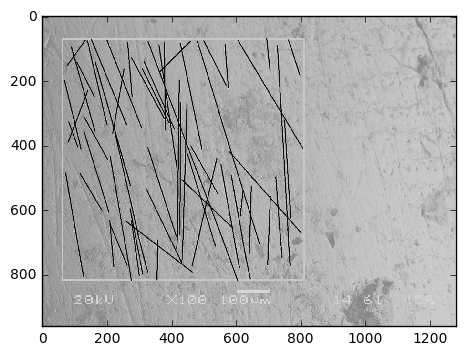

In [148]:
plt.imshow(distance_red, interpolation='none',cmap=plt.cm.gray)


In [149]:
def binarizar(distance_red):
    threshold_global_otsu = threshold_otsu(distance_red)
    imgBin = distance_red <= threshold_global_otsu
    return imgBin

0 hay 15 lineas realmente


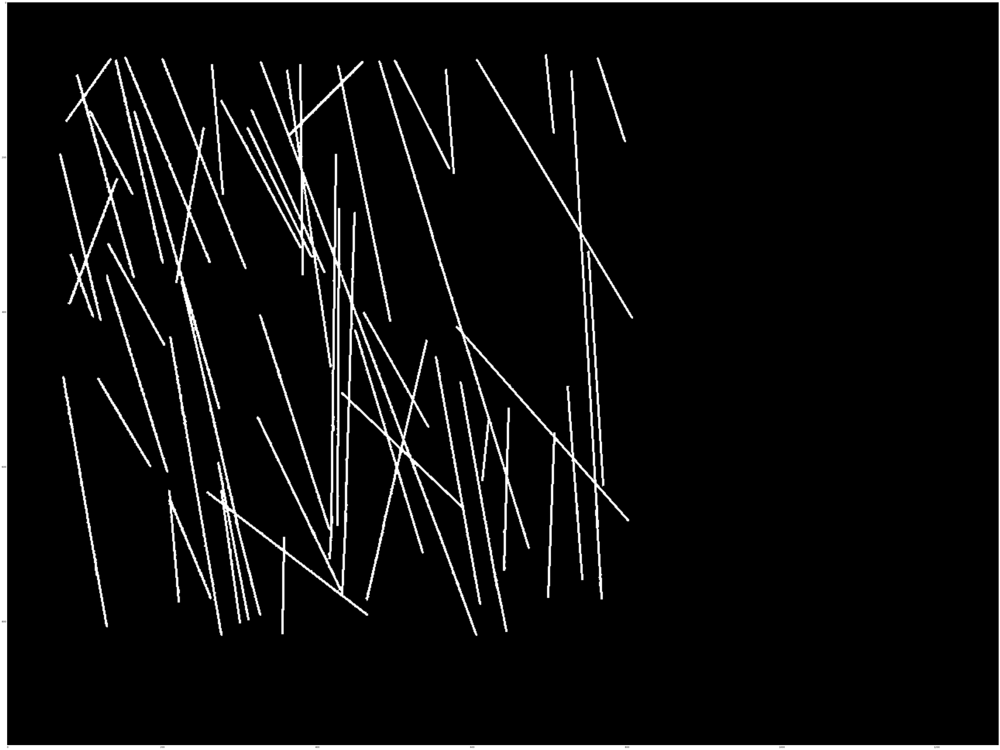

In [150]:
from skimage.filters import threshold_otsu

im=binarizar(distance_red)

mostrar(im,[])

In [104]:
procesado=Procesado()
sinRuido=procesado.reducirGrosor(im)
lines=procesado.proHough(10,5,11,sinRuido)        
G=nx.Graph()
G=procesado.combina(8,4,lines,G)
k_components = apxa.k_components(G)
segmentosDeVerdad=procesado.segmentosVerdad(k_components,lines)


In [102]:
def mostrar(imagen,segmentos):
    plt.figure(figsize=(75, 75)) 
    plt.imshow(imagen, cmap=plt.cm.gray)
    for line in segmentos:
        p0, p1 = line
        plt.plot((p0[0], p1[0]), (p0[1], p1[1]),'r',linewidth=9)
    #fig.savefig('foo.jpg',bbox_inches='tight')
    print(len(segmentos),"hay 15 lineas realmente")

23 hay 15 lineas realmente


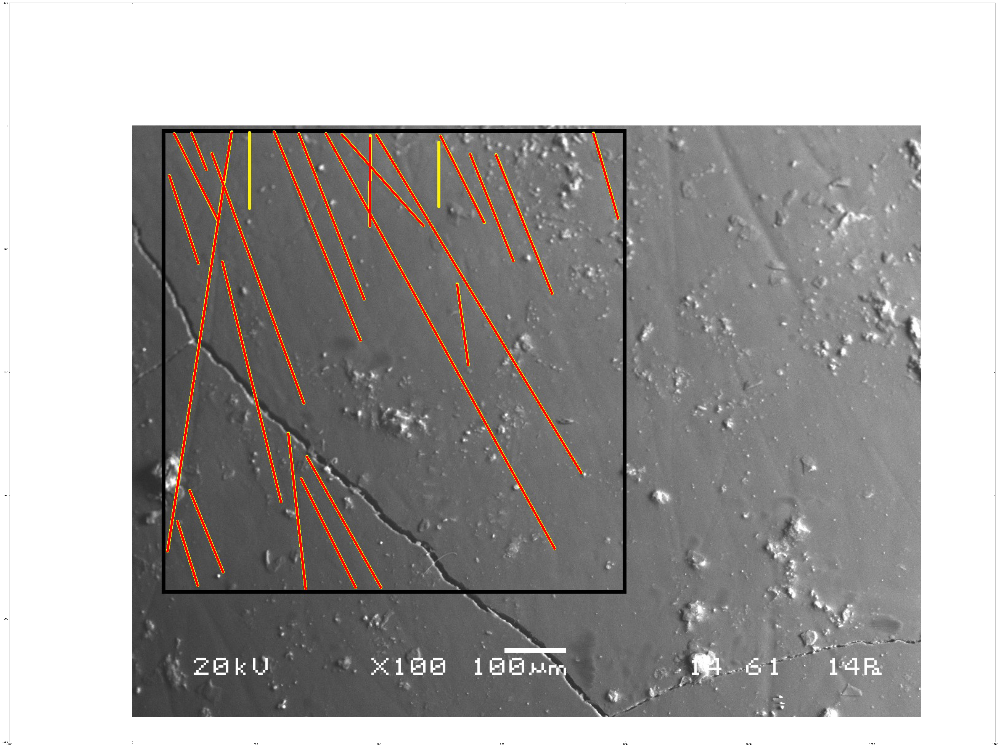

In [105]:
mostrar(img,segmentosDeVerdad)


In [ ]:
# porción de código 1.1 

# La imagen se ha leido y se ha guardado en la variable img
# con print se puede ver su contenido

print(img.shape)

In [ ]:
# Código 1.2
# Las imágenes son listas, se puede sacar su tamaño con len
alto = len(img)
ancho = len(img[0])
print(alto,ancho)

## Acceder a los valores de los pixels

In [ ]:
# porción de código 2
# accedo a el valor de un pixel en concreto. Posición 0,0
# En python las filas y columnas (y resto de listas) empiezan en 0, no en 1
# rojo = 11, verde = 255, azul = 1
print(img[0][0])

El print solo nos sacar los valores R,G,B de la imagen

Para mostrar gráficos se usa la librería matplotlib

Hay una función imshow que muestra una imagen

In [ ]:
# porción de código 3
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# interpolation='none' es una opción, en imagenes grandes se puede quitar
# prueba que pasa quitando esa opción
plt.imshow(img, interpolation='none')
#plt.imshow(img)

### Teoría sobre imágenes en Python

Un pixel es una lista con 3 valores = [R,G,B]
Una imagen es una matriz de 3 dimensiones.
imagen = lista de filas o una matriz 3D
fila = lista de pixels o una matriz 2D
pixel = lista de 3 valores (o matriz 1D)

```
[ 11 255   1] es un pixel

[[ 11 255   1] 
 [ 11 255   1]
 [255 240   0]
 [254 239   0]
 [249   7   6]
 [249   7   6]] es una fila
``` 
Y arriba tenemos la imagen entera.



Trabajar con listas de 3 dimensiones es complicado.
Por suerte tenemos numpy, la librería de python para trabajar con matrices.

In [ ]:
# porción de código 4
import numpy as np

#asi creo una lista o matriz normal en una de numpy
array1 = np.array([1,2,3])
array2 = np.array([10,20,30])

# y ahora se pueden hacer ciertas operaciones de una sola vez

print("array1 + array2")
print(array1+array2)

matriz1 = np.array([[1,2],[3,4]])
matriz2 = np.array([[8,6],[3,5]])

print("valor absoluto matriz1 - matriz2")
print(abs(matriz1-matriz2))



In [ ]:
# porción de código 5
'''
Con numpy también se puede restar/sumar/multiplicar/dividir 
(o cualquier otra operación de 2 operandos) entre cada uno de los 
valores de la matriz y otro valor que indiquemos
'''
print(matriz1)

print(matriz1-5)

In [ ]:
# porción de código 6

'''
Además de hacer operaciones entre 2 elementos como sumas, 
restas etc, se pueden hacer operaciones de agregación.
Operaciones de agregación: sum, mean, std etc
Operaciones que toman un conjunto de valores y devuelven un resultado
'''
print("Matriz 1")
print(matriz1)

print("Media de todos los elementos de Matriz 1")
print(matriz1.mean())
print("Media de cada una de las columnas de Matriz 1")
print(matriz1.mean(axis=0))
print("Media de cada una de las filas de Matriz 1")
print(matriz1.mean(axis=1))


Las imagenes ya son internamente matrices de numpy. Así que podemos sumarlas, restarlas y lo que queramos.



In [ ]:
## Tarea 1
'''
Coger la variable img y restarla el valor [ 11,255,1]
que se corresponde al verde, guardar el valor en img2
Sacar con un print el contenido de img2 
'''
img2 = img - [ 11,255,1]
print(img2)

### Diferencia entre colores. Distancia de manhatan

Es una forma de calcular la distancia entre puntos de N dimensiones.

Una coordenada x,y es un punto de dos dimensiones.
Un color R,G,B es un punto en 3 dimensiones.

La distancia de manhatan entre dos puntos p y q se calcula como $manhathan(p,q)=\sum_i^N{|p_i-q_i|}$

Ejemplo, la distancia entre p = [7,2] y q = [10,7] 
manhatan(p,q) = |7-10| + |2-7| =8 

Vamos a calcular la distancia entre colores usando manhatan.

https://es.wikipedia.org/wiki/Geometr%C3%ADa_del_taxista

In [ ]:
## Tarea 2
'''
Coger la variable img y restarla el valor [ 11,255,1], 
hacer el valor absoluto (abs) de la resta. 
Puedes ver como se hace el valor absoluto en la 
porción de código 4.

Guardar el valor en img3
Sacar con un print el contenido de img3 
'''

img2 = abs(img - [ 11,255,1])
print(img2)

In [ ]:
# Tarea 3

'''
Coger la variable img y restarla el valor [ 11,255,1], 
hacer el valor absoluto (abs) de la resta. 
Esto da una imagen en donde en cada posición 
tenemos un pixel cuyos valores son:
|Rimg-Rc|, |Gimg-Gc|, |Bimg-Bc| 

Donde Rimg significa componente Rojo de la imagen y 
Rc significa componente rojo del color (en nuestro caso [ 11,255,1])

Para hacer manhatan tenemos que sumar estos 3 valores.
Aunque en lugar de sumarlos vamos a hacer la media. 
La suma podría darnos valores mayores de 255 y no podríamos dibujarlo

Haz la media usando porción de código 6

Guardar el valor en img4
Sacar el contenido con 
plt.imshow(img4,cmap=cm.gray)
El cmap=cm.gray es para decir que la imagen es en escala de grises
Los pixels no son [R,G,B] sino solamente la intensidad
El 0 (negro) significa que hay una distancia mínima al color que buscamos
El 1 (blanco) que la distancia es máxima
'''

img2 = abs(img - [ 11,255,1]).mean(axis=2)
plt.imshow(img2,cmap=cm.gray,interpolation='none')

In [ ]:
# Tarea 4

'''
Carga la imagen peque.jpg y haz lo mismo que en la tarea 3
Mira porción de código 1

Se ve que el pitch que estamos buscando como es verde 
produce un resultado cercano a negro.
'''

imgPeque = io.imread("/Users/Tobar/Downloads/dietaColores/peque.jpg")
img2 = abs(imgPeque - [ 11,255,1]).mean(axis=2)
plt.imshow(img2,cmap=cm.gray,interpolation='none')

## Modelos de color

Existen distintos espacios de color o modelos de color. El RGB es el más utilizado, pero hay otros como el CIELAB
https://es.wikipedia.org/wiki/Espacio_de_color_Lab

El CIELAB está diseñado para parecerse más a la percepción humana. A la hora de realizar diferencias de colores se usa más el modelo CIELAB

In [ ]:
# porción de código 7

# en skimage se puede pasar de RGB a lab con la función  rgb2lab
from skimage.color import rgb2lab

imgPequeLab=rgb2lab(imgPeque)




In [ ]:
# Tarea 5
'''
Hacer lo mismo que en la tarea anterior, pero transformando antes
la imagen al modelo lab y haciendo la resta con [ 87.77055811,  -85.85365291,   83.14645062]
que es el verde en LAB

Nota que ahora hay más diferencia entre los claros y los oscuros
'''
img2 = abs(imgPequeLab - [ 87.77055811,  -85.85365291,   83.14645062]).mean(axis=2)
plt.imshow(img2,cmap=cm.gray,interpolation='none')

## Funciones

Las funciones sirven para agrupar código y para hacer el código reutilizable.
Podemos definir una porción de código que haga algo, convertirlo en función y despues llamar a esa función cuantas veces queramos con otros argumentos.


Abajo creo una función "elevaCuadrado", tiene un parámetro que se llama n.
1. Las funciones se crean usando **def** nombreFunción los parámetros entre paréntesis y :
2. El cuerpo de la función esta indentado hacia dentro con el tabulado.
3. Los parámetros se pueden usar el el cuerpo de la función para hacer operaciones
4. Se devuelven valores con **return**

In [ ]:
# porción de código 8
# funciones
def elevaCuadrado(n):
    print("voy a elevar al cuadrado el ",n)
    return n*n

print(elevaCuadrado(5))

print(elevaCuadrado(10))


Se puede cambiar el modelo de color de una imagen entera con la función rgb2lab.
Pero he probado a hacerlo solo con un pixel y no funciona. He investigado la razón y es porque en una imagen entera los pixels en RBG están en base 255 (El máximo es 255, el valor medio es 127 y mínimo es 0) y si le pasamos un píxel solamente espera que los valores estén en base 1 (el máximo es 1, el valor medio 0.5 etc)

Habría que hacer un cambio de base (una regla de tres)

In [ ]:
# porción de código 9


numBase255 = 
numBase1 = (numBase255/255)

print(numBase1)

In [ ]:
# Tarea 6
'''
Crear una variable en la que se guarda un número en base 255.
Transformar esa variable en otra en base 1, 
utilizando la porción de código 9
'''


In [ ]:
# Tarea 7
'''
Vamos a hacer una función para pasar un pixel de RGB a CIELAB
'''
def pixelRGB2LAB(pixel):
    r,g,b = pixel # pixel es una lista con 3 valores, los puedo guardar en 3 variables asi
    # rBase1 = la expresión de la tarea 6
    # gBase1 = la expresión de la tarea 6
    # bBase1 = la expresión de la tarea 6
    
    # rgb2lab espera una lista3D, así que le paso el pixel dentro 
    # de una lista de listas y para sacarlo igual.
    return rgb2lab([[[rBase1,gBase1,bBase1]]])[0][0]
    



## Binarización (Thresholding)

https://en.wikipedia.org/wiki/Thresholding_%28image_processing%29

Se trata de convertir una imagen en escala de grises en otra en blanco y negro. Todos los valores que están por encima (o por debajo) de un determinado umbral se convierten en blanco y el resto se quedan en negro.

Como las imágenes de python son arrays de numpy se puede hacer el umbral de todos los pixels a la vez con una sola instrucción



In [ ]:
# porción de código 10


from skimage.data import camera

image = camera() # carga una imagen de ejemplo de skimage
umbral = 30 #cambia los valores a 30, 150, 200 a ver que pasa
binary = image > umbral

plt.imshow(binary,cmap=cm.gray)

In [ ]:
# Tarea 8
'''
Haz una función que reciba 3 parámetros: imagen, color y umbral
Con imagen y color se hace como en la Tarea 4 y posteriormente
a la imagen resultante se le hace una binarización siguiendo el 
código 10

'''

def diferenciaColor(imagen,color,umbral):
    print("differenciaColor")
    #imagen2 = manhathan de imagen y color
    #imagen3 = imagen2 > umbral
    #return imagen3
    

In [ ]:
# Tarea 9
'''
Haz una función que reciba 3 parámetros: imagen, color y umbral
Y hace como en la tarea anterior, pero antes convierte imagen y color al modelo LAB

'''

def diferenciaColorLab(imagen,color,umbral):
    print("diferenciaColorLab")
    #imagenLab = usa la porción de código 7
    #colorLab = usa la función de la tarea 7
    #imagenLab2 = manhathan de imagenLab y colorLab
    #imagenLab3 = imagenLab2 > umbral
    #return imagenLab3

In [ ]:
# Tarea 10

'''
Prueba la función anterior con la imagenPequeña y luego con una más grande
'''
# imgGrande = io.imread("/home/jose/Dropbox/dietaJose/oclusal/1 recuento oclusal 2.jpg")

#diff=diferenciaColorLab(imgPeque,[11,255,1],50)
#plt.imshow(diff,interpolation='none')

## Análisis de componentes conexas

Dada una imagen binaria (en blanco y negro), se pueden extraer de ella las componentes conexas.
Eso son las regiones de pixels que están conectados entre ellos. Los grupitos donde todos los pixels se están tocando.
En inglés a menudo a estas regiones se las llama Blobs (Binary Large Objects).

En skimage hay 2 funciones importantes para trabajar con estas componentes conexas:
- label: Devuelve las regiones de la imagen.
- regionprops: Devuelve las propiedades de estas regiones. Esas propiedades pueden ser alto, ancho, area, perímetro, orientación etc. En el siguiente notebook nosotros solamente vamos a extraer el alto y ancho para los cálculos.


Abajo hay un ejemplo que aplica la detección de los blobs en una imagen que se genera automáticamente.

Como tarea se puede sustituir esa imagen por la resultante de la Tarea 10



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from skimage import data

from skimage.measure import label
from skimage.measure import regionprops


# En este ejemplo se genera una imagen binaria con un montón de blobs
# Se dice que cree una imagen aleatoria, de tamaño 100
# que el 10% de los pixels sean blancos (volume_fraction = 0.1)
# que el tamaño maximo de un blob sea el 20% del total
image=data.binary_blobs(length=100,volume_fraction=0.1 ,
                        blob_size_fraction=0.2)




# label image regions
label_image = label(image)


fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(12, 12))
ax.imshow(image, cmap=plt.cm.gray)

for region in regionprops(label_image):
    
    
    # skip small images
    if region.area < 10:  
        continue
    '''
    fijaos que aqui arriba se saca el área, 
    así se pueden sacar todos los demás valores  
    '''
    
    
    # draw rectangle around segmented regions
    minr, minc, maxr, maxc = region.bbox
    rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                              fill=False, edgecolor='red', linewidth=2)
    ax.add_patch(rect)

plt.show()